In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import re
from bs4 import BeautifulSoup

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('train.csv')

In [3]:
df = df.dropna(subset=['question1', 'question2'])

# Sample 400,000 rows from the cleaned DataFrame
new_df = df.sample(100000, random_state=42)

In [4]:
new_df.isnull().sum()

id              0
qid1            0
qid2            0
question1       0
question2       0
is_duplicate    0
dtype: int64

In [5]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate
8067,8067,15738,15739,How do I play Pokémon GO in Korea?,How do I play Pokémon GO in China?,0
224279,224279,332326,332327,Will a breathing treatment help a cough?,How can I help someone that is unconscious but...,0
252452,252452,336023,366789,Is Kellyanne Conway annoying in your opinion?,Did Kellyanne Conway really imply that we shou...,0
174039,174039,268330,268331,How do you rate (1-10) and review Maruti Baleno?,What career options does one have after comple...,0
384863,384863,28901,233483,What are some good books on marketing?,What are some of the best books ever written a...,1


In [6]:
import re
from bs4 import BeautifulSoup

def preprocess(q):
    
    q = str(q).lower().strip()
    
    # Replace certain special characters with their string equivalents
    q = q.replace('%', ' percent')
    q = q.replace('$', ' dollar ')
    q = q.replace('₹', ' rupee ')
    q = q.replace('€', ' euro ')
    q = q.replace('@', ' at ')
    
    # The pattern '[math]' appears around 900 times in the whole dataset.
    q = q.replace('[math]', '')
    
    # Replacing some numbers with string equivalents (not perfect, can be done better to account for more cases)
    q = q.replace(',000,000,000 ', 'b ')
    q = q.replace(',000,000 ', 'm ')
    q = q.replace(',000 ', 'k ')
    q = re.sub(r'([0-9]+)000000000', r'\1b', q)
    q = re.sub(r'([0-9]+)000000', r'\1m', q)
    q = re.sub(r'([0-9]+)000', r'\1k', q)
    
    # Decontracting words
    # https://en.wikipedia.org/wiki/Wikipedia%3aList_of_English_contractions
    # https://stackoverflow.com/a/19794953
    contractions = { 
    "ain't": "am not",
    "aren't": "are not",
    "can't": "can not",
    "can't've": "can not have",
    "'cause": "because",
    "could've": "could have",
    "couldn't": "could not",
    "couldn't've": "could not have",
    "didn't": "did not",
    "doesn't": "does not",
    "don't": "do not",
    "hadn't": "had not",
    "hadn't've": "had not have",
    "hasn't": "has not",
    "haven't": "have not",
    "he'd": "he would",
    "he'd've": "he would have",
    "he'll": "he will",
    "he'll've": "he will have",
    "he's": "he is",
    "how'd": "how did",
    "how'd'y": "how do you",
    "how'll": "how will",
    "how's": "how is",
    "i'd": "i would",
    "i'd've": "i would have",
    "i'll": "i will",
    "i'll've": "i will have",
    "i'm": "i am",
    "i've": "i have",
    "isn't": "is not",
    "it'd": "it would",
    "it'd've": "it would have",
    "it'll": "it will",
    "it'll've": "it will have",
    "it's": "it is",
    "let's": "let us",
    "ma'am": "madam",
    "mayn't": "may not",
    "might've": "might have",
    "mightn't": "might not",
    "mightn't've": "might not have",
    "must've": "must have",
    "mustn't": "must not",
    "mustn't've": "must not have",
    "needn't": "need not",
    "needn't've": "need not have",
    "o'clock": "of the clock",
    "oughtn't": "ought not",
    "oughtn't've": "ought not have",
    "shan't": "shall not",
    "sha'n't": "shall not",
    "shan't've": "shall not have",
    "she'd": "she would",
    "she'd've": "she would have",
    "she'll": "she will",
    "she'll've": "she will have",
    "she's": "she is",
    "should've": "should have",
    "shouldn't": "should not",
    "shouldn't've": "should not have",
    "so've": "so have",
    "so's": "so as",
    "that'd": "that would",
    "that'd've": "that would have",
    "that's": "that is",
    "there'd": "there would",
    "there'd've": "there would have",
    "there's": "there is",
    "they'd": "they would",
    "they'd've": "they would have",
    "they'll": "they will",
    "they'll've": "they will have",
    "they're": "they are",
    "they've": "they have",
    "to've": "to have",
    "wasn't": "was not",
    "we'd": "we would",
    "we'd've": "we would have",
    "we'll": "we will",
    "we'll've": "we will have",
    "we're": "we are",
    "we've": "we have",
    "weren't": "were not",
    "what'll": "what will",
    "what'll've": "what will have",
    "what're": "what are",
    "what's": "what is",
    "what've": "what have",
    "when's": "when is",
    "when've": "when have",
    "where'd": "where did",
    "where's": "where is",
    "where've": "where have",
    "who'll": "who will",
    "who'll've": "who will have",
    "who's": "who is",
    "who've": "who have",
    "why's": "why is",
    "why've": "why have",
    "will've": "will have",
    "won't": "will not",
    "won't've": "will not have",
    "would've": "would have",
    "wouldn't": "would not",
    "wouldn't've": "would not have",
    "y'all": "you all",
    "y'all'd": "you all would",
    "y'all'd've": "you all would have",
    "y'all're": "you all are",
    "y'all've": "you all have",
    "you'd": "you would",
    "you'd've": "you would have",
    "you'll": "you will",
    "you'll've": "you will have",
    "you're": "you are",
    "you've": "you have"
    }

    q_decontracted = []

    for word in q.split():
        if word in contractions:
            word = contractions[word]

        q_decontracted.append(word)

    q = ' '.join(q_decontracted)
    q = q.replace("'ve", " have")
    q = q.replace("n't", " not")
    q = q.replace("'re", " are")
    q = q.replace("'ll", " will")
    
    # Removing HTML tags
    q = BeautifulSoup(q)
    q = q.get_text()
    
    # Remove punctuations
    pattern = re.compile('\W')
    q = re.sub(pattern, ' ', q).strip()

    
    return q
    

In [7]:
preprocess("I've already! wasn't <b>done</b>?")

'i have already  was not done'

In [8]:
new_df['question1'] = new_df['question1'].apply(preprocess)
new_df['question2'] = new_df['question2'].apply(preprocess)

In [9]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate
8067,8067,15738,15739,how do i play pokémon go in korea,how do i play pokémon go in china,0
224279,224279,332326,332327,will a breathing treatment help a cough,how can i help someone that is unconscious but...,0
252452,252452,336023,366789,is kellyanne conway annoying in your opinion,did kellyanne conway really imply that we shou...,0
174039,174039,268330,268331,how do you rate 1 10 and review maruti baleno,what career options does one have after comple...,0
384863,384863,28901,233483,what are some good books on marketing,what are some of the best books ever written a...,1


In [10]:
new_df['q1_len'] = new_df['question1'].str.len() 
new_df['q2_len'] = new_df['question2'].str.len()

In [11]:
new_df['q1_num_words'] = new_df['question1'].apply(lambda row: len(row.split(" ")))
new_df['q2_num_words'] = new_df['question2'].apply(lambda row: len(row.split(" ")))
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words
8067,8067,15738,15739,how do i play pokémon go in korea,how do i play pokémon go in china,0,33,33,8,8
224279,224279,332326,332327,will a breathing treatment help a cough,how can i help someone that is unconscious but...,0,39,62,7,11
252452,252452,336023,366789,is kellyanne conway annoying in your opinion,did kellyanne conway really imply that we shou...,0,44,117,7,22
174039,174039,268330,268331,how do you rate 1 10 and review maruti baleno,what career options does one have after comple...,0,47,126,12,23
384863,384863,28901,233483,what are some good books on marketing,what are some of the best books ever written a...,1,37,60,7,11


In [12]:
def common_words(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
    return len(w1 & w2)

In [13]:
new_df['word_common'] = new_df.apply(common_words, axis=1)
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common
8067,8067,15738,15739,how do i play pokémon go in korea,how do i play pokémon go in china,0,33,33,8,8,7
224279,224279,332326,332327,will a breathing treatment help a cough,how can i help someone that is unconscious but...,0,39,62,7,11,2
252452,252452,336023,366789,is kellyanne conway annoying in your opinion,did kellyanne conway really imply that we shou...,0,44,117,7,22,2
174039,174039,268330,268331,how do you rate 1 10 and review maruti baleno,what career options does one have after comple...,0,47,126,12,23,1
384863,384863,28901,233483,what are some good books on marketing,what are some of the best books ever written a...,1,37,60,7,11,5


In [14]:
def total_words(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
    return (len(w1) + len(w2))

In [15]:
new_df['word_total'] = new_df.apply(total_words, axis=1)
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total
8067,8067,15738,15739,how do i play pokémon go in korea,how do i play pokémon go in china,0,33,33,8,8,7,16
224279,224279,332326,332327,will a breathing treatment help a cough,how can i help someone that is unconscious but...,0,39,62,7,11,2,17
252452,252452,336023,366789,is kellyanne conway annoying in your opinion,did kellyanne conway really imply that we shou...,0,44,117,7,22,2,28
174039,174039,268330,268331,how do you rate 1 10 and review maruti baleno,what career options does one have after comple...,0,47,126,12,23,1,31
384863,384863,28901,233483,what are some good books on marketing,what are some of the best books ever written a...,1,37,60,7,11,5,18


In [16]:
new_df['word_share'] = round(new_df['word_common']/new_df['word_total'],2)
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share
8067,8067,15738,15739,how do i play pokémon go in korea,how do i play pokémon go in china,0,33,33,8,8,7,16,0.44
224279,224279,332326,332327,will a breathing treatment help a cough,how can i help someone that is unconscious but...,0,39,62,7,11,2,17,0.12
252452,252452,336023,366789,is kellyanne conway annoying in your opinion,did kellyanne conway really imply that we shou...,0,44,117,7,22,2,28,0.07
174039,174039,268330,268331,how do you rate 1 10 and review maruti baleno,what career options does one have after comple...,0,47,126,12,23,1,31,0.03
384863,384863,28901,233483,what are some good books on marketing,what are some of the best books ever written a...,1,37,60,7,11,5,18,0.28


In [17]:
# Advanced Features
from nltk.corpus import stopwords

def fetch_token_features(row):
    
    q1 = row['question1']
    q2 = row['question2']
    
    SAFE_DIV = 0.0001 

    STOP_WORDS = stopwords.words("english")
    
    token_features = [0.0]*8
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features

    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    return token_features


In [18]:
token_features = new_df.apply(fetch_token_features, axis=1)

new_df["cwc_min"]       = list(map(lambda x: x[0], token_features))
new_df["cwc_max"]       = list(map(lambda x: x[1], token_features))
new_df["csc_min"]       = list(map(lambda x: x[2], token_features))
new_df["csc_max"]       = list(map(lambda x: x[3], token_features))
new_df["ctc_min"]       = list(map(lambda x: x[4], token_features))
new_df["ctc_max"]       = list(map(lambda x: x[5], token_features))
new_df["last_word_eq"]  = list(map(lambda x: x[6], token_features))
new_df["first_word_eq"] = list(map(lambda x: x[7], token_features))

In [19]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,word_total,word_share,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq
8067,8067,15738,15739,how do i play pokémon go in korea,how do i play pokémon go in china,0,33,33,8,8,...,16,0.44,0.749981,0.749981,0.999975,0.999975,0.874989,0.874989,0.0,1.0
224279,224279,332326,332327,will a breathing treatment help a cough,how can i help someone that is unconscious but...,0,39,62,7,11,...,17,0.12,0.499988,0.399992,0.000000,0.000000,0.285710,0.181817,0.0,0.0
252452,252452,336023,366789,is kellyanne conway annoying in your opinion,did kellyanne conway really imply that we shou...,0,44,117,7,22,...,28,0.07,0.499988,0.181817,0.000000,0.000000,0.285710,0.090909,0.0,0.0
174039,174039,268330,268331,how do you rate 1 10 and review maruti baleno,what career options does one have after comple...,0,47,126,12,23,...,31,0.03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
384863,384863,28901,233483,what are some good books on marketing,what are some of the best books ever written a...,1,37,60,7,11,...,18,0.28,0.666644,0.399992,0.749981,0.499992,0.714276,0.454541,1.0,1.0


In [20]:

import distance

In [21]:


def fetch_length_features(row):
    q1 = row['question1']
    q2 = row['question2']

    length_features = [0.0] * 3

    # Converting the Sentence into Tokens:
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return length_features

    # Absolute length features
    length_features[0] = abs(len(q1_tokens) - len(q2_tokens))

    # Average Token Length of both Questions
    length_features[1] = (len(q1_tokens) + len(q2_tokens)) / 2

    strs = list(distance.lcsubstrings(q1, q2))
    if strs:
        length_features[2] = len(strs[0]) / (min(len(q1), len(q2)) + 1)
    else:
        length_features[2] = 0.0

    return length_features
    

In [22]:
length_features = new_df.apply(fetch_length_features, axis=1)

new_df['abs_len_diff'] = list(map(lambda x: x[0], length_features))
new_df['mean_len'] = list(map(lambda x: x[1], length_features))
new_df['longest_substr_ratio'] = list(map(lambda x: x[2], length_features))

In [23]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio
8067,8067,15738,15739,how do i play pokémon go in korea,how do i play pokémon go in china,0,33,33,8,8,...,0.749981,0.999975,0.999975,0.874989,0.874989,0.0,1.0,0.0,8.0,0.823529
224279,224279,332326,332327,will a breathing treatment help a cough,how can i help someone that is unconscious but...,0,39,62,7,11,...,0.399992,0.000000,0.000000,0.285710,0.181817,0.0,0.0,4.0,9.0,0.250000
252452,252452,336023,366789,is kellyanne conway annoying in your opinion,did kellyanne conway really imply that we shou...,0,44,117,7,22,...,0.181817,0.000000,0.000000,0.285710,0.090909,0.0,0.0,15.0,14.5,0.400000
174039,174039,268330,268331,how do you rate 1 10 and review maruti baleno,what career options does one have after comple...,0,47,126,12,23,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,11.0,15.5,0.062500
384863,384863,28901,233483,what are some good books on marketing,what are some of the best books ever written a...,1,37,60,7,11,...,0.399992,0.749981,0.499992,0.714276,0.454541,1.0,1.0,4.0,9.0,0.368421


In [43]:
!pip install fuzzywuzzy

In [24]:
# Fuzzy Features
from fuzzywuzzy import fuzz

def fetch_fuzzy_features(row):
    
    q1 = row['question1']
    q2 = row['question2']
    
    fuzzy_features = [0.0]*4
    
    # fuzz_ratio
    fuzzy_features[0] = fuzz.QRatio(q1, q2)

    # fuzz_partial_ratio
    fuzzy_features[1] = fuzz.partial_ratio(q1, q2)

    # token_sort_ratio
    fuzzy_features[2] = fuzz.token_sort_ratio(q1, q2)

    # token_set_ratio
    fuzzy_features[3] = fuzz.token_set_ratio(q1, q2)

    return fuzzy_features

In [25]:
fuzzy_features = new_df.apply(fetch_fuzzy_features, axis=1)

# Creating new feature columns for fuzzy features
new_df['fuzz_ratio'] = list(map(lambda x: x[0], fuzzy_features))
new_df['fuzz_partial_ratio'] = list(map(lambda x: x[1], fuzzy_features))
new_df['token_sort_ratio'] = list(map(lambda x: x[2], fuzzy_features))
new_df['token_set_ratio'] = list(map(lambda x: x[3], fuzzy_features))

In [26]:
print(new_df.shape)
new_df.head()

(100000, 28)


,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
8067,8067,15738,15739,how do i play pokémon go in korea,how do i play pokémon go in china,0,33,33,8,8,...,0.874989,0.0,1.0,0.0,8.0,0.823529,88,88,81,90
224279,224279,332326,332327,will a breathing treatment help a cough,how can i help someone that is unconscious but...,0,39,62,7,11,...,0.181817,0.0,0.0,4.0,9.0,0.250000,28,49,48,55
252452,252452,336023,366789,is kellyanne conway annoying in your opinion,did kellyanne conway really imply that we shou...,0,44,117,7,22,...,0.090909,0.0,0.0,15.0,14.5,0.400000,34,57,37,53
174039,174039,268330,268331,how do you rate 1 10 and review maruti baleno,what career options does one have after comple...,0,47,126,12,23,...,0.000000,0.0,0.0,11.0,15.5,0.062500,21,38,32,33
384863,384863,28901,233483,what are some good books on marketing,what are some of the best books ever written a...,1,37,60,7,11,...,0.454541,1.0,1.0,4.0,9.0,0.368421,68,62,66,88


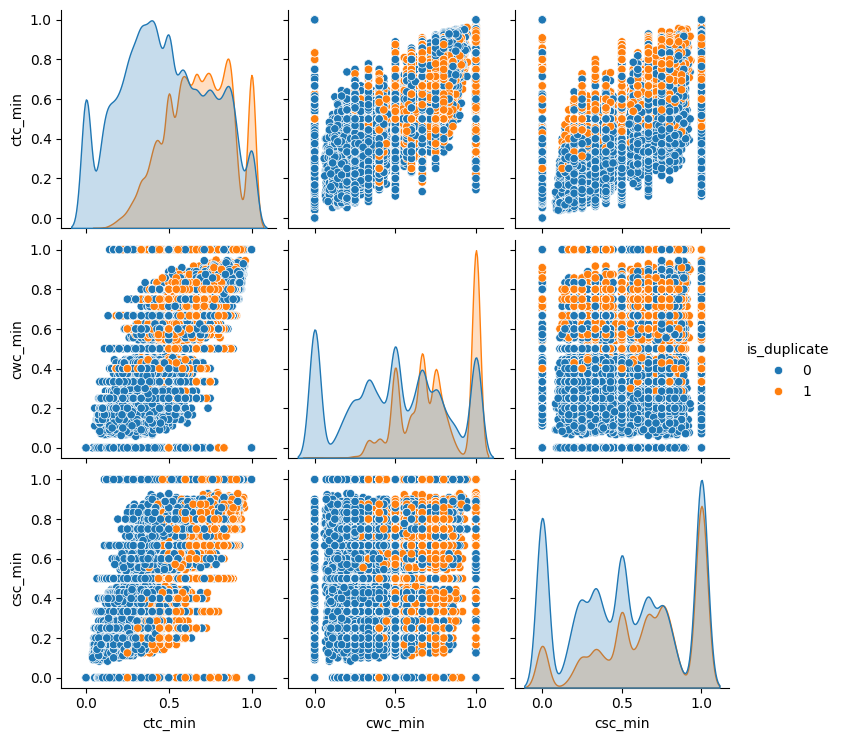

In [27]:
sns.pairplot(new_df[['ctc_min', 'cwc_min', 'csc_min', 'is_duplicate']],hue='is_duplicate')

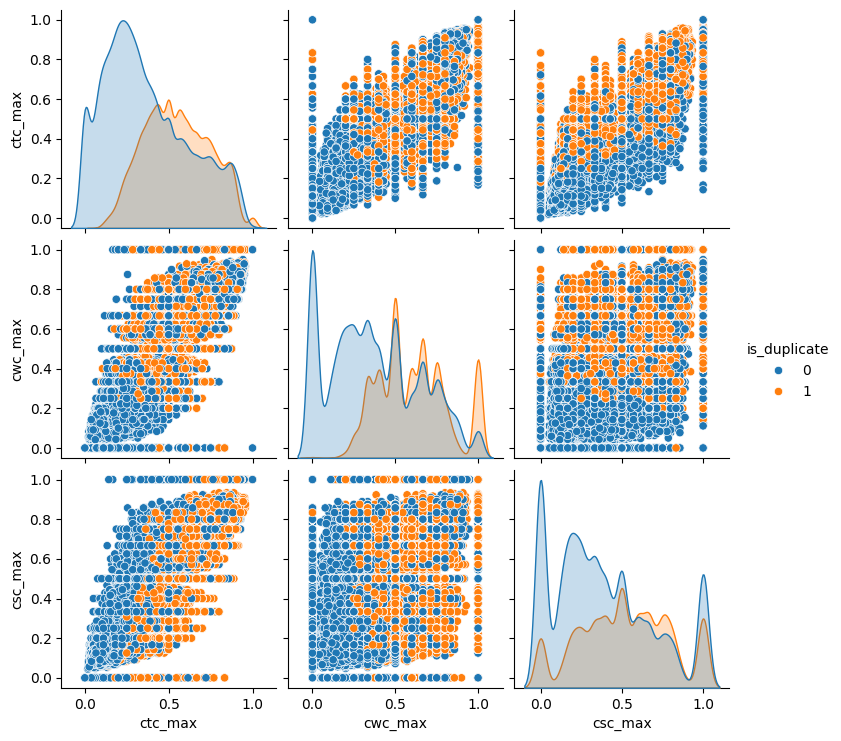

In [28]:
sns.pairplot(new_df[['ctc_max', 'cwc_max', 'csc_max', 'is_duplicate']],hue='is_duplicate')

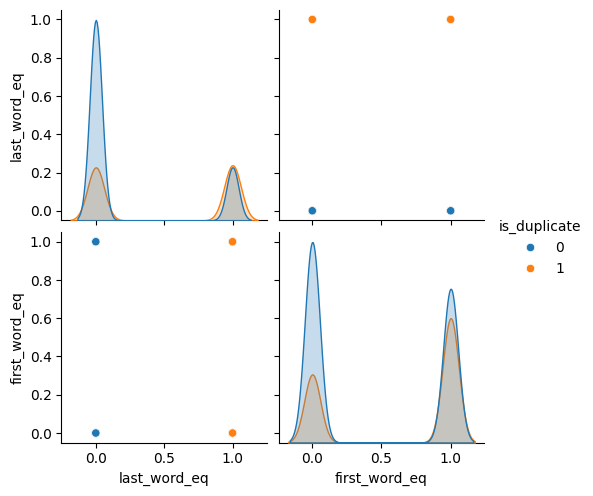

In [29]:
sns.pairplot(new_df[['last_word_eq', 'first_word_eq', 'is_duplicate']],hue='is_duplicate')

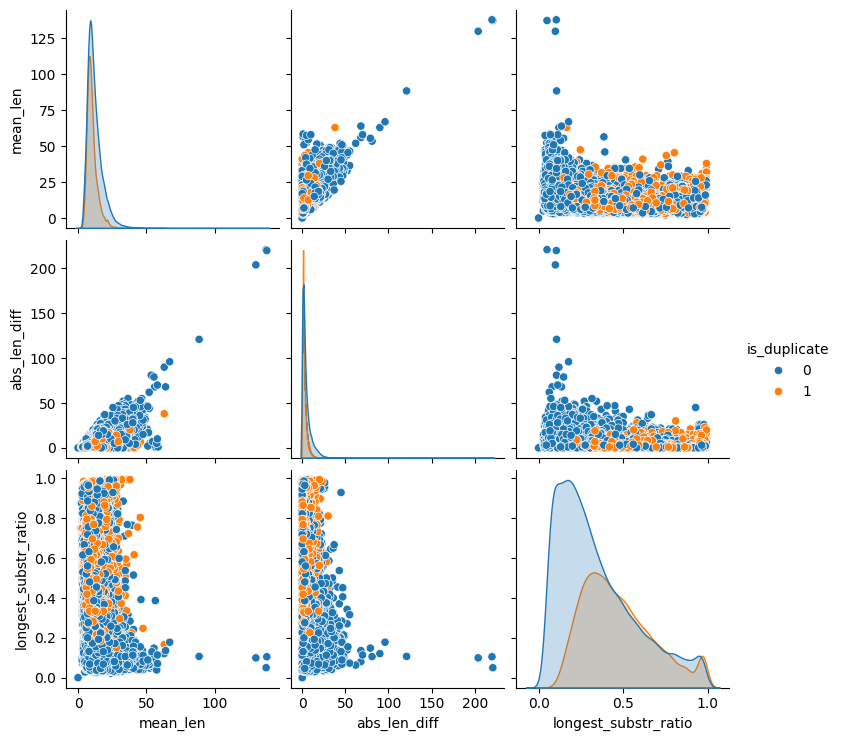

In [30]:
sns.pairplot(new_df[['mean_len', 'abs_len_diff','longest_substr_ratio', 'is_duplicate']],hue='is_duplicate')

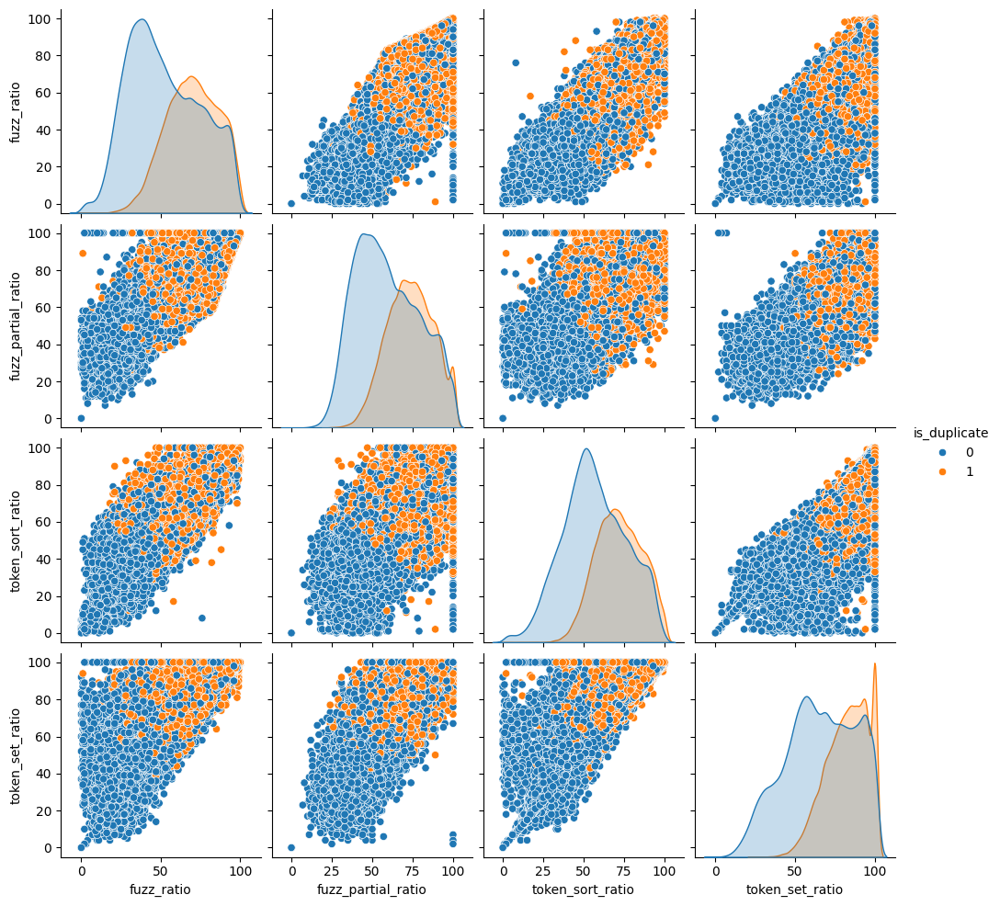

In [31]:
sns.pairplot(new_df[['fuzz_ratio', 'fuzz_partial_ratio','token_sort_ratio','token_set_ratio', 'is_duplicate']],hue='is_duplicate')

In [32]:
# Using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimention

from sklearn.preprocessing import MinMaxScaler

X = MinMaxScaler().fit_transform(new_df[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']])
y = new_df['is_duplicate'].values

In [33]:
from sklearn.manifold import TSNE

tsne2d = TSNE(
    n_components=2,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.294s...
[t-SNE] Computed neighbors for 100000 samples in 36.780s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probab

[t-SNE] Iteration 600: error = 2.5776308, gradient norm = 0.0032295 (50 iterations in 61.185s)
[t-SNE] Iteration 650: error = 2.5011592, gradient norm = 0.0029803 (50 iterations in 60.732s)
[t-SNE] Iteration 700: error = 2.4393668, gradient norm = 0.0027714 (50 iterations in 66.849s)
[t-SNE] Iteration 750: error = 2.3882022, gradient norm = 0.0025855 (50 iterations in 67.077s)
[t-SNE] Iteration 800: error = 2.3448591, gradient norm = 0.0024217 (50 iterations in 58.292s)
[t-SNE] Iteration 850: error = 2.3074186, gradient norm = 0.0022803 (50 iterations in 59.522s)
[t-SNE] Iteration 900: error = 2.2747114, gradient norm = 0.0021694 (50 iterations in 56.467s)
[t-SNE] Iteration 950: error = 2.2459490, gradient norm = 0.0020656 (50 iterations in 58.490s)
[t-SNE] Iteration 1000: error = 2.2203338, gradient norm = 0.0019655 (50 iterations in 60.236s)
[t-SNE] KL divergence after 1000 iterations: 2.220334


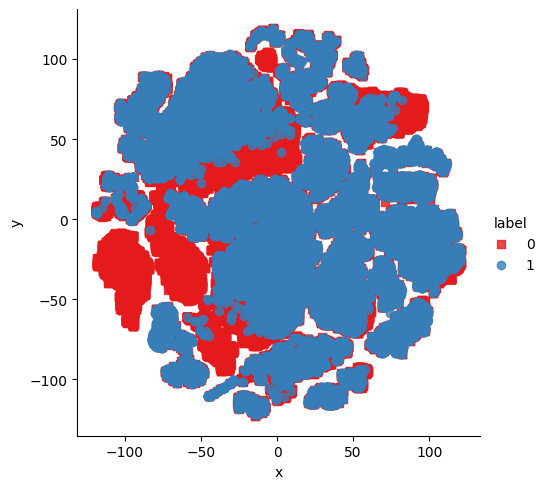

In [35]:
x_df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=x_df, x='x', y='y', hue='label', fit_reg=False,palette="Set1",markers=['s','o'])


In [36]:
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 100000 samples in 0.192s...
[t-SNE] Computed neighbors for 100000 samples in 31.716s...
[t-SNE] Computed conditional probabilities for sample 1000 / 100000
[t-SNE] Computed conditional probabilities for sample 2000 / 100000
[t-SNE] Computed conditional probabilities for sample 3000 / 100000
[t-SNE] Computed conditional probabilities for sample 4000 / 100000
[t-SNE] Computed conditional probabilities for sample 5000 / 100000
[t-SNE] Computed conditional probabilities for sample 6000 / 100000
[t-SNE] Computed conditional probabilities for sample 7000 / 100000
[t-SNE] Computed conditional probabilities for sample 8000 / 100000
[t-SNE] Computed conditional probabilities for sample 9000 / 100000
[t-SNE] Computed conditional probabilities for sample 10000 / 100000
[t-SNE] Computed conditional probabilities for sample 11000 / 100000
[t-SNE] Computed conditional probabilities for sample 12000 / 100000
[t-SNE] Computed conditional probab

[t-SNE] Iteration 600: error = 2.1473320, gradient norm = 0.0009818 (50 iterations in 324.739s)
[t-SNE] Iteration 650: error = 2.0789731, gradient norm = 0.0008773 (50 iterations in 261.320s)
[t-SNE] Iteration 700: error = 2.0250511, gradient norm = 0.0007731 (50 iterations in 245.268s)
[t-SNE] Iteration 750: error = 1.9820999, gradient norm = 0.0006657 (50 iterations in 246.375s)
[t-SNE] Iteration 800: error = 1.9479231, gradient norm = 0.0005771 (50 iterations in 230.674s)
[t-SNE] Iteration 850: error = 1.9205570, gradient norm = 0.0004974 (50 iterations in 226.623s)
[t-SNE] Iteration 900: error = 1.8995959, gradient norm = 0.0003928 (50 iterations in 226.494s)
[t-SNE] Iteration 950: error = 1.8836230, gradient norm = 0.0003292 (50 iterations in 220.076s)
[t-SNE] Iteration 1000: error = 1.8712319, gradient norm = 0.0002735 (50 iterations in 234.279s)
[t-SNE] KL divergence after 1000 iterations: 1.871232


In [37]:
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
py.init_notebook_mode(connected=True)

trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

In [27]:
ques_df = new_df[['question1','question2']]
ques_df.head()

,question1,question2
8067,how do i play pokémon go in korea,how do i play pokémon go in china
224279,will a breathing treatment help a cough,how can i help someone that is unconscious but...
252452,is kellyanne conway annoying in your opinion,did kellyanne conway really imply that we shou...
174039,how do you rate 1 10 and review maruti baleno,what career options does one have after comple...
384863,what are some good books on marketing,what are some of the best books ever written a...


In [28]:
final_df = new_df.drop(columns=['id','qid1','qid2','question1','question2'])
print(final_df.shape)
final_df.head()

(100000, 23)


,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share,cwc_min,cwc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
8067,0,33,33,8,8,7,16,0.44,0.749981,0.749981,...,0.874989,0.0,1.0,0.0,8.0,0.823529,88,88,81,90
224279,0,39,62,7,11,2,17,0.12,0.499988,0.399992,...,0.181817,0.0,0.0,4.0,9.0,0.250000,28,49,48,55
252452,0,44,117,7,22,2,28,0.07,0.499988,0.181817,...,0.090909,0.0,0.0,15.0,14.5,0.400000,34,57,37,53
174039,0,47,126,12,23,1,31,0.03,0.000000,0.000000,...,0.000000,0.0,0.0,11.0,15.5,0.062500,21,38,32,33
384863,1,37,60,7,11,5,18,0.28,0.666644,0.399992,...,0.454541,1.0,1.0,4.0,9.0,0.368421,68,62,66,88


In [29]:
import gensim
from nltk.tokenize import word_tokenize
import numpy as np

# Preprocess the text data
tokenized_q1 = [word_tokenize(q.lower()) for q in ques_df['question1']]
tokenized_q2 = [word_tokenize(q.lower()) for q in ques_df['question2']]

# Train Word2Vec model
all_questions = [tokens for tokens in tokenized_q1 + tokenized_q2 if tokens]
model = gensim.models.Word2Vec(all_questions, vector_size=300, window=10, min_count=1, workers=4)

# Get the question vectors
q1_vectors = []
q2_vectors = []

for i in range(len(ques_df)):
    q1_tokens = tokenized_q1[i]
    q2_tokens = tokenized_q2[i]
    
    if q1_tokens:
        q1_vectors.append(model.wv[q1_tokens])
    else:
        q1_vectors.append([])
    
    if q2_tokens:
        q2_vectors.append(model.wv[q2_tokens])
    else:
        q2_vectors.append([])

# Calculate the question vector as the mean of the word vectors
q1_arr = np.array([np.mean(q1_vec, axis=0) if len(q1_vec) > 0 else np.zeros(300) for q1_vec in q1_vectors])
q2_arr = np.array([np.mean(q2_vec, axis=0) if len(q2_vec) > 0 else np.zeros(300) for q2_vec in q2_vectors])

In [30]:
len(q1_arr[14990])

300

In [31]:
temp_df1 = pd.DataFrame(q1_arr, index= ques_df.index)
temp_df2 = pd.DataFrame(q2_arr, index= ques_df.index)
temp_df = pd.concat([temp_df1, temp_df2], axis=1)
temp_df.shape

(100000, 600)

In [32]:
temp_df1[1]

8067     -0.032159
224279    0.036832
252452    0.139493
174039   -0.069085
384863    0.185535
            ...   
124703   -0.049944
335688   -0.193081
35290     0.680826
176347   -0.219628
147577    0.030541
Name: 1, Length: 100000, dtype: float64

In [33]:
final_df = pd.concat([final_df, temp_df], axis=1)
print(final_df.shape)
final_df.head()

(100000, 623)


,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,word_common,word_total,word_share,cwc_min,cwc_max,...,290,291,292,293,294,295,296,297,298,299
8067,0,33,33,8,8,7,16,0.44,0.749981,0.749981,...,0.019506,0.294028,0.022186,0.184008,0.010725,0.018919,-0.327840,0.354773,-0.071149,-0.280139
224279,0,39,62,7,11,2,17,0.12,0.499988,0.399992,...,0.137055,-0.001611,0.427484,0.307040,-0.029471,-0.273410,-0.850742,-0.284617,-0.083346,-0.221633
252452,0,44,117,7,22,2,28,0.07,0.499988,0.181817,...,-0.200946,-0.059745,0.243855,-0.139270,-0.134845,-0.437649,-0.361705,-0.164910,-0.323431,0.029975
174039,0,47,126,12,23,1,31,0.03,0.000000,0.000000,...,0.027265,0.351337,-0.100703,-0.247006,-0.007189,-0.222337,-0.145881,0.330645,-0.390354,-0.188465
384863,1,37,60,7,11,5,18,0.28,0.666644,0.399992,...,-0.146714,0.014490,0.156887,-0.536535,0.032769,0.209196,0.100259,0.078518,-0.116931,0.058528


In [34]:
from sklearn.model_selection import train_test_split

# Create the target variable (y)
y = final_df.iloc[:, 0].values

# Create the feature matrix (X)
X = final_df.iloc[:, 1:].values

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

In [35]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
y_pred = rf.predict(X_test)
accuracy_score(y_test,y_pred)

0.80445

In [36]:
from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb.fit(X_train,y_train)
y_pred1 = xgb.predict(X_test)
accuracy_score(y_test,y_pred1)

0.80565

In [37]:
from sklearn.metrics import confusion_matrix

In [38]:
# for random forest model
confusion_matrix(y_test,y_pred)

array([[10761,  1804],
       [ 2107,  5328]], dtype=int64)

In [39]:
# for xgboost model
confusion_matrix(y_test,y_pred1)

array([[10670,  1895],
       [ 1992,  5443]], dtype=int64)

In [40]:
def test_common_words(q1,q2):
    w1 = set(map(lambda word: word.lower().strip(), q1.split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), q2.split(" ")))    
    return len(w1 & w2)

In [41]:
def test_total_words(q1,q2):
    w1 = set(map(lambda word: word.lower().strip(), q1.split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), q2.split(" ")))    
    return (len(w1) + len(w2))

In [42]:
def test_fetch_token_features(q1,q2):
    
    SAFE_DIV = 0.0001 

    STOP_WORDS = stopwords.words("english")
    
    token_features = [0.0]*8
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features

    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    return token_features


In [43]:
def test_fetch_length_features(q1,q2):
    
    length_features = [0.0]*3
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return length_features
    
    # Absolute length features
    length_features[0] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    length_features[1] = (len(q1_tokens) + len(q2_tokens))/2
    
    strs = list(distance.lcsubstrings(q1, q2))
    length_features[2] = len(strs[0]) / (min(len(q1), len(q2)) + 1)
    
    return length_features

In [44]:
def test_fetch_fuzzy_features(q1,q2):
    
    fuzzy_features = [0.0]*4
    
    # fuzz_ratio
    fuzzy_features[0] = fuzz.QRatio(q1, q2)

    # fuzz_partial_ratio
    fuzzy_features[1] = fuzz.partial_ratio(q1, q2)

    # token_sort_ratio
    fuzzy_features[2] = fuzz.token_sort_ratio(q1, q2)

    # token_set_ratio
    fuzzy_features[3] = fuzz.token_set_ratio(q1, q2)

    return fuzzy_features

In [45]:
def get_question_vector(question, model):
    tokens = word_tokenize(question.lower())
    vectors = [model.wv[token] for token in tokens if token in model.wv]
    if vectors:
        return np.mean(vectors, axis=0)
    else:
        return np.zeros(300)  # Assuming vector_size is 300


In [46]:
def query_point_creator(q1,q2):
    
    input_query = []
    
    # preprocess
    q1 = preprocess(q1)
    q2 = preprocess(q2)
    
    # fetch basic features
    input_query.append(len(q1))
    input_query.append(len(q2))
    
    input_query.append(len(q1.split(" ")))
    input_query.append(len(q2.split(" ")))
    
    input_query.append(test_common_words(q1,q2))
    input_query.append(test_total_words(q1,q2))
    input_query.append(round(test_common_words(q1,q2)/test_total_words(q1,q2),2))
    
    # fetch token features
    token_features = test_fetch_token_features(q1,q2)
    input_query.extend(token_features)
    
    # fetch length based features
    length_features = test_fetch_length_features(q1,q2)
    input_query.extend(length_features)
    
    # fetch fuzzy features
    fuzzy_features = test_fetch_fuzzy_features(q1,q2)
    input_query.extend(fuzzy_features)
    
    # Get the Word2Vec feature for q1
    q1_vector = get_question_vector(q1, model).reshape(1, -1)

    # Get the Word2Vec feature for q2
    q2_vector = get_question_vector(q2, model).reshape(1, -1)
    
    
    
    return np.hstack((np.array(input_query).reshape(1,22),q1_vector,q2_vector))

In [47]:
q1 = 'Where is the capital of India?'
q2 = 'What is the current capital of Pakistan?'
q3 = 'Which city serves as the capital of India?'
q4 = 'What is the business capital of India?'

In [51]:
rf.predict(query_point_creator(q1,q4))

array([0], dtype=int64)

In [54]:
# Save the Word2Vec model
model.save('word2vec_model.model')

# Save the Random Forest model
pickle.dump(rf, open('rf_model.pkl', 'wb'))

# Save the function (as a lambda function) if it's simple, or just document it
# In practice, you might save this as part of a preprocessing class
pickle.dump(get_question_vector, open('get_question_vector.pkl', 'wb'))